In [2]:
#importing necessary libraries
import pandas as pd
import numpy as np
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import math
pd.set_option('display.max_rows', 300)
import pickle

In [28]:
#loading csv
df1=pd.read_csv('query(5).csv')

In [29]:
#coordinates of our data in question
df1['latitude'].max(), df1['latitude'].min(), df1.longitude.max(), df1.longitude.min()

(38.467, 37.231, -121.3955, -123.008)

In [30]:
#dataframe
df1.shape

(14118, 22)

In [31]:
#checking the variance in my magnitude column
listA= df1['mag'] 
np.var(listA)

0.28067086505275973

## Data cleaning the datetime series

In [32]:
#converting my time series from string to datetime
df1['time2']=[ele.replace('T', ' ') for ele in df1['time']]

In [33]:
#function converting string into datetime
def datetime(data):
    a=[]
    for i in range(14118):
        a.append(df1.time2[i][0:19])
    return a

In [34]:
#new variable containing my converted datetime
a=datetime(df1['time2'])

In [35]:
#passing the variable into my dataframe in a new column
df1['time3']=a

In [36]:
#examination to see cleaned data
df1['time3'].head(1)

0    2020-08-03 06:44:17
Name: time3, dtype: object

In [37]:
# renaming my dataframe
results=df1

In [16]:
#realized my data is backwards present to past rather than past to present so I will groupby 
#and pass agg function to get the df into the preferred order
results=df1.groupby('time3').mean()

In [20]:
pickle.dump(results, open( "save.results", "wb" ) )

In [17]:
O=results.reset_index()

In [19]:
t= results[results['mag']<4.0]

### All quakes between 4 and 3 in my data (100 in total). These are quakes that can be felt but only if one is quiet and still

In [20]:
s=t[t['mag']>=3.0]
O=s.reset_index()

In [22]:
v=t[t['mag']>2.0]

### All quakes between 3 and 2 in my data (1423 in total)

In [23]:
O=v[v['mag']<3.0]

In [20]:
k=v.mag.value_counts()

### All quakes below 2.0 in data (12618 in total)

In [24]:
O=t[t['mag']<2]

# Finding quakes above 4.0

In [25]:
#wanted to study quakes 4.0 and above. There are 8 of them this decade.
O=results[results['mag']>=4.0]

### Analyzing 6.0 quakes - I chose to analyze the following quakes for EDA to provide more detail of the anatomy of an earthquake, and find out precursors or seismic activity right before a quake.

### The variance that was used in my presentation was also calculated within these steps from quake A-F.

In [38]:
#Largest earthquake of decade in the SF region 6.1 rated. Wanted to study seismic activity 2 weeks
#before earthquake to find patterns. I see that magnitude of precursor quakes were very small and 
#had little variance, my hypothesis soon followed.
Napa_eq=df1[7896:8297]
G=Napa_eq.groupby('time3').mean().tail(60).reset_index()


In [24]:
#observed variance of magnitude in the two weeks before Napa earthquake
np.var(df1['mag'][7896:8297])

0.28486846474835387

In [25]:
np.var(results['mag'][8167:8197])

0.22134988888888887

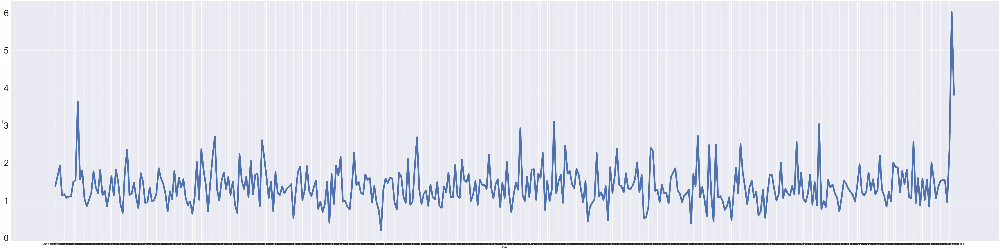

In [26]:
#plot of the data from 3 months before
fig= plt.figure(figsize=(100,25))
sns.set(style='darkgrid')
sns.lineplot(x= df1['time3'][7895:8296], y=df1['mag'][7895:8296], linewidth=9.5)
plt.xticks(rotation=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=50)
plt.savefig('Napaquake.png')

# Analyzing 4.0 quakes 

### Analysis of Quake A 

In [27]:
#studied earthquakes that were 4.0 or greater
quakeA=results[12847:13147]

quakeA.reset_index(inplace=True)

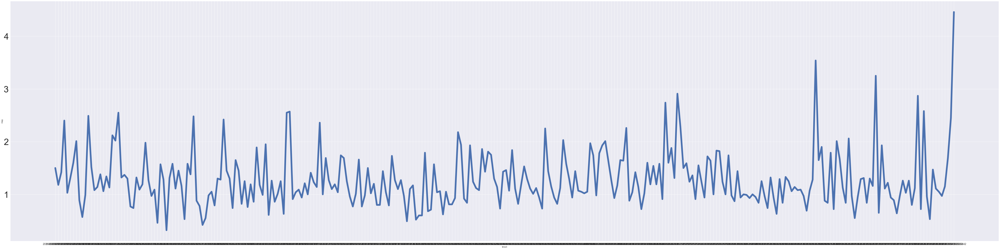

In [28]:
fig= plt.figure(figsize=(100,25))

sns.set(style='darkgrid')
sns.lineplot(x=quakeA.time3, y=quakeA.mag, linewidth=9.5)
plt.xticks(rotation=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=50)
plt.savefig('quakeA.png')

In [29]:
#variance of the data leading up to earthquake
np.var(results['mag'][12847:13147])

0.2844367500000001

In [30]:
np.var(results.mag[13116:13146])

0.4325445555555556

### Analysis of Quake B

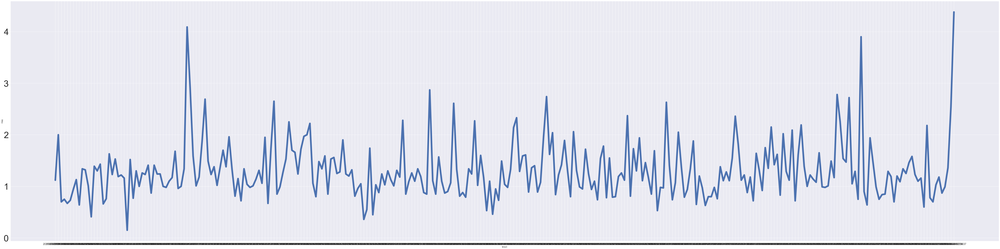

In [31]:
#plot of another 4.0 earthquake
fig= plt.figure(figsize=(100,25))
sns.set(style='darkgrid')
quakeb=results[10809:11110]
quakeb.reset_index(inplace=True)
plt.xticks(rotation=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=50)
sns.lineplot(x= quakeb['time3'], y = quakeb['mag'], linewidth=9.5)
plt.savefig('quakeB.png')

In [32]:
#variance of data leading up to earthquake
np.var(results['mag'][10809:11110])


0.31459500005518704

In [33]:
np.var(results['mag'][11080:11110])

0.5189823333333333

### Analysis of Quake C

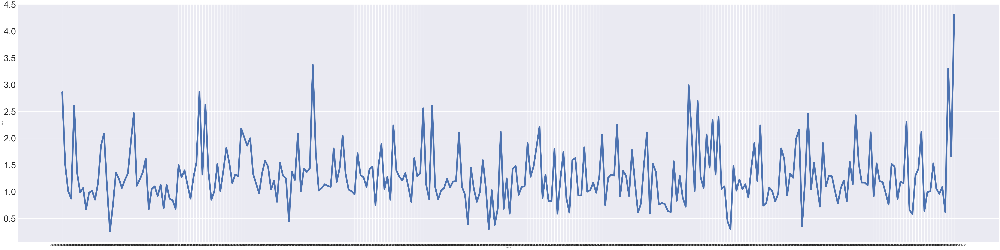

In [34]:
#graph of another quake that was 4.0
fig= plt.figure(figsize=(100,25))
sns.set(style='darkgrid')
quakec=results[12458:12758]
quakec.reset_index(inplace=True)
plt.xticks(rotation=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=50)
sns.lineplot(x= quakec['time3'], y = quakec['mag'], linewidth=9.5)
plt.savefig('quakeC.png')

In [35]:
#variance of data leading up to quake
np.var(results['mag'][12458:12758])


0.3008476266666666

In [36]:
#variance of data 2 weeks before quake
np.var(results['mag'][12728:12758])

0.6190515555555555

### Analysis of Quake D

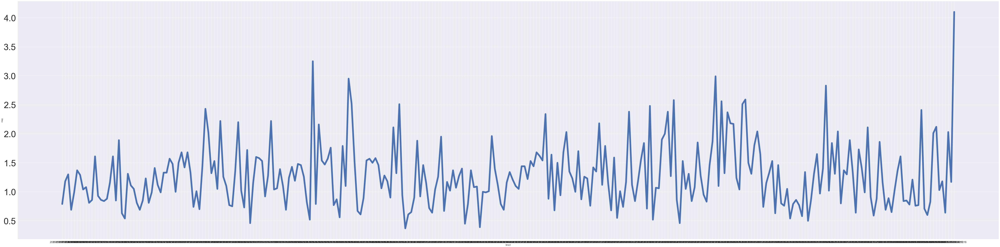

In [37]:
#graph of another quake 4.0 
fig= plt.figure(figsize=(100,25))
sns.set(style='darkgrid')
quaked=results[1368:1668]
quaked.reset_index(inplace=True)
plt.xticks(rotation=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=50)
sns.lineplot(x= quaked['time3'], y = quaked['mag'], linewidth=9.5)
plt.savefig('quakeD.png')

In [38]:
#variance of data leading up to quake (2 months)
np.var(results['mag'][1368:1668])

0.3007555766666668

In [39]:
#variance of data 2 weeks before quake
np.var(results['mag'][1638:1668])

0.5519223333333332

### Analysis of Quake E

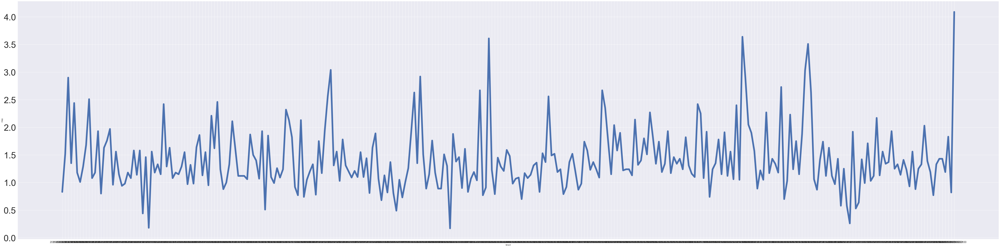

In [40]:
#graph of more 4.0 quakes 8 in total.
fig= plt.figure(figsize=(100,25))
sns.set(style='darkgrid')
quakee=results[7123:7423]
quakee.reset_index(inplace=True)
plt.xticks(rotation=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=50)
sns.lineplot(x= quakee['time3'], y = quakee['mag'], linewidth=9.5)
plt.savefig('quakeE.png')

In [41]:
#variance of data a month before quake
np.var(results['mag'][7123:7423])

0.32476164888888914

In [42]:
#variance of data 2 weeks before quake
np.var(results['mag'][7123:7153])

0.3281765555555556

### Analysis of Quake F

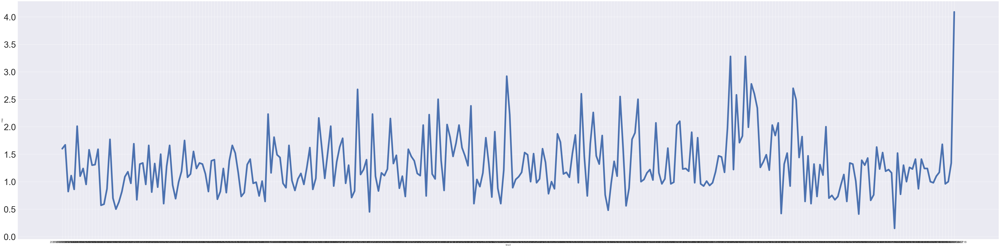

In [43]:
#plot of quake that was 4.0 or higher
fig= plt.figure(figsize=(100,25))
sns.set(style='darkgrid')
quakef=results[10554:10854]
quakef.reset_index(inplace=True)

plt.xticks(rotation=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=50)
plt.xticks(np.arange(0, len(quakef['time3'])))
sns.lineplot(x= quakef['time3'], y = quakef['mag'], linewidth=9.5)
plt.savefig('quakeF.png')

In [44]:
#variance of data leading up to earthquake
np.var(results['mag'][10554:10854])

0.28706138999999997

In [45]:
#variance of data 2 weeks before quake
np.var(results['mag'][10824:10854])

0.37334899999999993

In [46]:
#new column for datetime
df1['time3']= pd.to_datetime(df1['time3']) 

In [47]:
df1['mag']=df1['mag'].round(4)

## Dickey-Fuller Test for stationarity

In [48]:
#Dickey_Fuller Test
from statsmodels.tsa.stattools import adfuller

In [49]:
#Dickey_Fuller Test
adf_test = adfuller(results['mag'])

In [50]:
#test results which reject H0 hypothesis and we have stationarity.
print ("ADF = " + str(adf_test[0]))
print ("p-value = " +str(adf_test[1]))

ADF = -21.463834004081065
p-value = 0.0


In [47]:
#create train/test datasets
work_results=results[12794:]
X = work_results

train_data = X.mag[:1058]
test_data = X.mag[1058:]

## AR Model

In [52]:
#importing auto_regressive model
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import r2_score

#train the autoregression model
model = AutoReg(train_data, 2)
model_fit = model.fit()

# print('The lag value chose is: %s' % model_fitted.k_ar)

/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:218: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


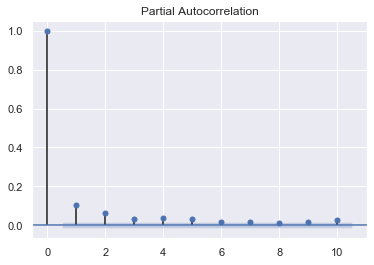

In [53]:
# import the plotting functions for acf and pacf  
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_pacf(results['mag'], lags=10);

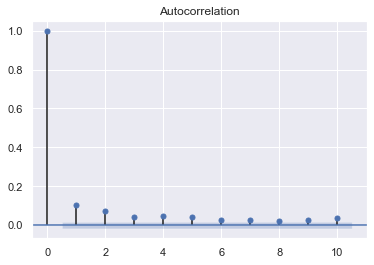

In [54]:
plot_acf(results['mag'], lags=10);

## Experimentation with rolling windows forecasting

In [447]:
rollingW_results=results[10000:]
X = rollingW_results

train_data = X.mag
test_data = X.mag[1058:]

In [448]:
fig= plt.figure(figsize=(250,70))
rolling_mean = train_data[-500:].rolling(window = 3).mean()
rolling_std = train_data[-500:].rolling(window = 3).std()
plt.plot(train_data[:], color = 'blue', label = 'Original', linewidth=12)
plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean', linewidth=12)
plt.plot(rolling_std, color = 'black', label = 'Rolling Std', linewidth=12)
plt.legend(loc = 'best')
plt.title('Rolling Mean & Rolling Standard Deviation')
plt.show()

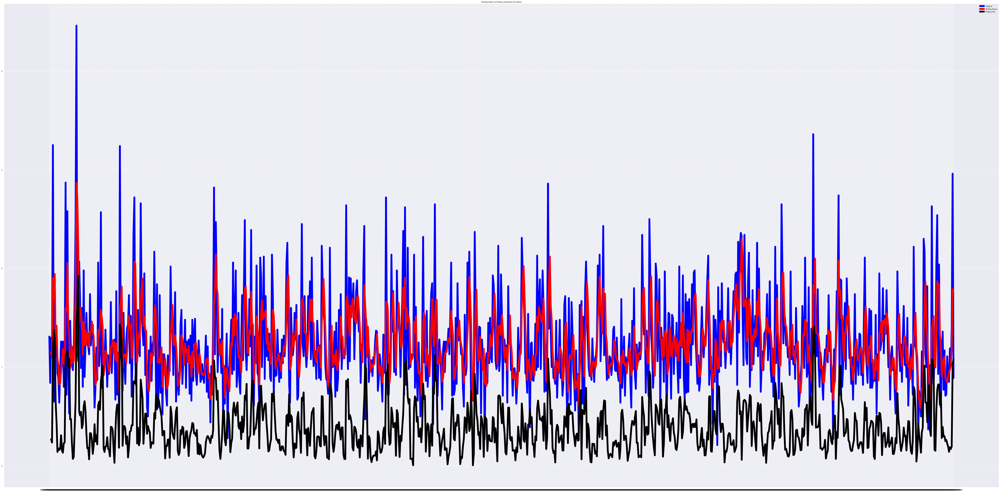

In [57]:
fig= plt.figure(figsize=(100,50))
rolling_mean = work_results['mag'][-1000:].rolling(window = 3).mean()
rolling_std = work_results['mag'][-1000:].rolling(window = 3).std()
plt.plot(results['mag'][-1000:], color = 'blue', label = 'Original', linewidth=10)
plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean', linewidth=10)
plt.plot(rolling_std, color = 'black', label = 'Rolling Std', linewidth=10)
plt.legend(loc = 'best')
plt.title('Rolling Mean & Rolling Standard Deviation')
plt.show()

In [58]:
# rolling_mean.dropna()

In [73]:
from pmdarima.metrics import smape
print(f"SMAPE: {smape(rolling_mean.dropna()[0:264], train_data[0:264])}")

NameError: name 'rolling_mean' is not defined

""


In [451]:
#this is the RMSE
((rolling_mean[-500:])-(train_data[-500:])).mean()**.5

(2.095678132116577e-18+0.034225021182853206j)

## ARIMA Model -- after much trial and error I decided to truncate my training data to 1058 obs. because it allowed for better forecasting. In the previous tries with my full 10 year dataset, the model would predict the mean/median.

In [63]:
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.api 
from statsmodels.tsa.stattools import acf

# Create Training and Test
train = work_results.mag[:1058]
test = work_results.mag[1058:]

/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:218: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


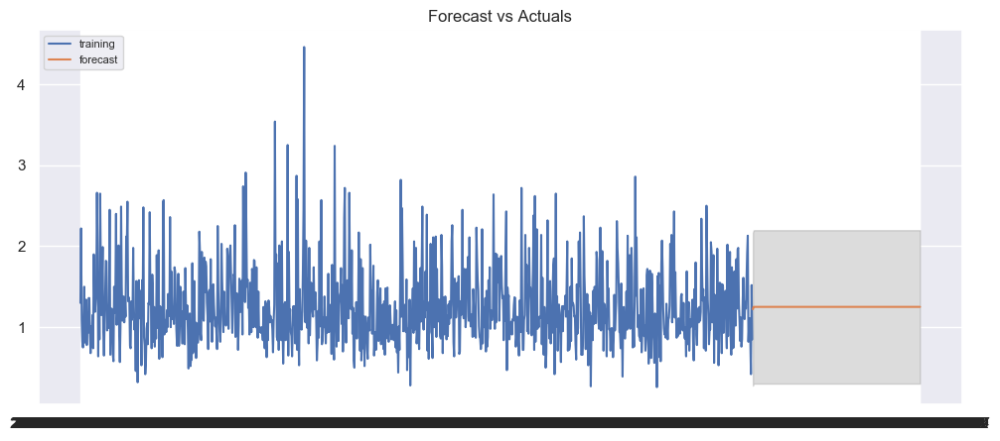

In [64]:
# Build Model
# model = ARIMA(train, order=(1,0,0))  
model = ARIMA(train, order=(1, 0, 0))  
fitted = model.fit(disp=-1)  

# Forecast
fc, se, conf = fitted.forecast(264, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(train, label='training')
# plt.plot(test, label='actual')
plt.plot(fc_series, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

In [65]:
import pmdarima as pm

In [66]:
auto = pm.auto_arima(train, d=0, seasonal=False, stepwise=True,
                     suppress_warnings=True, error_action="ignore", max_p=6,
                     max_order=None, trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=2.84 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3625.745, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2059.973, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2948.312, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1828.353, Time=0.08 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=1734.124, Time=0.13 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=1686.935, Time=0.15 sec
 ARIMA(5,0,0)(0,0,0)[0]             : AIC=1649.211, Time=0.14 sec
 ARIMA(6,0,0)(0,0,0)[0]             : AIC=inf, Time=0.16 sec
 ARIMA(5,0,1)(0,0,0)[0]             : AIC=inf, Time=1.19 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=inf, Time=0.94 sec
 ARIMA(6,0,1)(0,0,0)[0]             : AIC=inf, Time=1.41 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=1471.830, Time=0.90 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=1469.911, Time=0.55 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1468.047, Time=0

### Did auto arima and was able to get a SMAPE and RMSE score

In [67]:
from sklearn.metrics import mean_squared_error
from pmdarima.metrics import smape

model = auto  # seeded from the model we've already fit

def forecast_one_step():
    fc, conf_int = model.predict(n_periods=1, return_conf_int=True)
    return (
        fc.tolist()[0],
        np.asarray(conf_int).tolist()[0])

forecasts = []
confidence_intervals = []

for new_ob in test:
    fc, conf = forecast_one_step()
    forecasts.append(fc)
    confidence_intervals.append(conf)

    # Updates the existing model with a small number of MLE steps
#     model.update(new_ob)

print(f"Mean squared error: {mean_squared_error(test, forecasts)}")
print(f"SMAPE: {smape(test, forecasts)}")

RMSE= np.sqrt( np.mean(test-forecasts)**2)
RMSE

Mean squared error: 0.24196117683694807
SMAPE: 28.9963934723018


0.03631558157385369

In [68]:
work_results.reset_index(inplace=True)

#### ARIMA Model RMSE=.0363, SMAPE=28.9

## LSTM Model 

In [53]:
#importing libraries
from keras.models import Sequential
from keras.layers import Dense, LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler, StandardScaler

In [54]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [55]:
# I selected a portion of my data for my train, test, split
final_results=results[6000:]

In [56]:
#scale data before passing thru NN
scaler = RobustScaler()
scaled_data = scaler.fit_transform(final_results[['mag']])
data= final_results.filter(['mag'])
dataset=data.values

In [57]:
dataset.shape

(8118, 1)

In [58]:
O=scaled_data

In [59]:
#getting len of training data 
training_data_len = math.ceil(len(dataset)*.8)
training_data_len

6495

In [60]:
#Obtaining the entire set of training data to be splitter
train_data= scaled_data[0:training_data_len , :]



In [61]:
# split data in x, y train
x_train=[]
y_train=[]

for i in range(60, len(train_data)):
    x_train.append(train_data[i-60:i, 0])
    y_train.append(train_data[i, 0])

In [62]:
#turning data into np.array
x_train=np.array(x_train) 
y_train=np.array(y_train)

In [63]:
# Reshape the data
x_train= np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
x_train.shape

(6435, 60, 1)

In [400]:
#building the neural net
model=Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(x_train.shape[1], 1)))
model.add(LSTM(100, return_sequences=False))
model.add(Dense(35))
model.add(Dense(1))

In [401]:
#Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

In [402]:
# model.fit(x_train, y_train, batch_size=1000, epochs=2000)

Epoch 1/2000
7/7 [==============================] - 8s 1s/step - loss: 0.7863
Epoch 2/2000
7/7 [==============================] - 7s 1s/step - loss: 0.7705
Epoch 3/2000
7/7 [==============================] - 8s 1s/step - loss: 0.7671
Epoch 4/2000
7/7 [==============================] - 8s 1s/step - loss: 0.7664
Epoch 5/2000
7/7 [==============================] - 9s 1s/step - loss: 0.7654
Epoch 6/2000
7/7 [==============================] - 7s 1s/step - loss: 0.7638
Epoch 7/2000
7/7 [==============================] - 9s 1s/step - loss: 0.7644
Epoch 8/2000
7/7 [==============================] - 9s 1s/step - loss: 0.7628
Epoch 9/2000
7/7 [==============================] - 9s 1s/step - loss: 0.7630
Epoch 10/2000
7/7 [==============================] - 9s 1s/step - loss: 0.7616
Epoch 11/2000
7/7 [==============================] - 8s 1s/step - loss: 0.7612
Epoch 12/2000
7/7 [==============================] - 8s 1s/step - loss: 0.7610
Epoch 13/2000
7/7 [==============================] - 9s 1s/st

Epoch 104/2000
7/7 [==============================] - 10s 1s/step - loss: 0.7317
Epoch 105/2000
7/7 [==============================] - 10s 1s/step - loss: 0.7352
Epoch 106/2000
7/7 [==============================] - 10s 1s/step - loss: 0.7343
Epoch 107/2000
7/7 [==============================] - 9s 1s/step - loss: 0.7363
Epoch 108/2000
7/7 [==============================] - 10s 1s/step - loss: 0.7362
Epoch 109/2000
7/7 [==============================] - 9s 1s/step - loss: 0.7375
Epoch 110/2000
7/7 [==============================] - 9s 1s/step - loss: 0.7317
Epoch 111/2000
7/7 [==============================] - 9s 1s/step - loss: 0.7247
Epoch 112/2000
7/7 [==============================] - 10s 1s/step - loss: 0.7282
Epoch 113/2000
7/7 [==============================] - 9s 1s/step - loss: 0.7236
Epoch 114/2000
7/7 [==============================] - 9s 1s/step - loss: 0.7199
Epoch 115/2000
7/7 [==============================] - 9s 1s/step - loss: 0.7163
Epoch 116/2000
7/7 [===============

Epoch 306/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0491
Epoch 307/2000
7/7 [==============================] - 10s 1s/step - loss: 0.0491
Epoch 308/2000
7/7 [==============================] - 13s 2s/step - loss: 0.0513
Epoch 309/2000
7/7 [==============================] - 10s 1s/step - loss: 0.0519
Epoch 310/2000
7/7 [==============================] - 11s 2s/step - loss: 0.0507
Epoch 311/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0458
Epoch 312/2000
7/7 [==============================] - 10s 1s/step - loss: 0.0456
Epoch 313/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0468
Epoch 314/2000
7/7 [==============================] - 10s 1s/step - loss: 0.0432
Epoch 315/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0426
Epoch 316/2000
7/7 [==============================] - 7s 1s/step - loss: 0.0404
Epoch 317/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0405
Epoch 318/2000
7/7 [==============

7/7 [==============================] - 11s 2s/step - loss: 0.0087
Epoch 508/2000
7/7 [==============================] - 11s 2s/step - loss: 0.0088
Epoch 509/2000
7/7 [==============================] - 10s 1s/step - loss: 0.0077
Epoch 510/2000
7/7 [==============================] - 10s 1s/step - loss: 0.0071
Epoch 511/2000
7/7 [==============================] - 10s 1s/step - loss: 0.0066
Epoch 512/2000
7/7 [==============================] - 10s 1s/step - loss: 0.0061
Epoch 513/2000
7/7 [==============================] - 10s 1s/step - loss: 0.0061
Epoch 514/2000
7/7 [==============================] - 12s 2s/step - loss: 0.0060
Epoch 515/2000
7/7 [==============================] - 11s 2s/step - loss: 0.0057
Epoch 516/2000
7/7 [==============================] - 11s 2s/step - loss: 0.0060
Epoch 517/2000
7/7 [==============================] - 11s 2s/step - loss: 0.0064
Epoch 518/2000
7/7 [==============================] - 10s 1s/step - loss: 0.0067
Epoch 519/2000
7/7 [=======================

7/7 [==============================] - 10s 1s/step - loss: 0.0023
Epoch 610/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0022
Epoch 611/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0022
Epoch 612/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0022
Epoch 613/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0022
Epoch 614/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0024
Epoch 615/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0022
Epoch 616/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0022
Epoch 617/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0022
Epoch 618/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0025
Epoch 619/2000
7/7 [==============================] - 9s 1s/step - loss: 0.0024
Epoch 620/2000
7/7 [==============================] - 10s 1s/step - loss: 0.0024
Epoch 621/2000
7/7 [==============================] -

KeyboardInterrupt: 

### I ran multiple LSTM models with different hyperparamters but this model 'modelJ.h5' had the best SMAPE. This model had 2 LSTM layers with 100 nodes + a dense layer of 35 and ran for 4000 epochs. 

In [409]:
# load a saved model
from numpy import loadtxt
from keras.models import load_model
 
# load model
model = load_model('modelJ.h5')

In [64]:
scaled_data.shape

(8118, 1)

In [65]:
#created the testing data
test_data= scaled_data[training_data_len-60: , :]
#Create teh data sets x_test and y_test
x_test=[]
y_test=dataset[training_data_len: ,:]

for i in range(60, len(test_data)):
    x_test.append(test_data[i-60:i, 0])

In [66]:
#Convert data into np.array
x_test = np.array(x_test)

In [67]:
#Reshape the data for keras
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1] , 1))

In [68]:
#predicted magnitudes to see if there is a looming notable earthquake
predictions=model.predict(x_test)
predictions= scaler.inverse_transform(predictions)

NameError: name 'model' is not defined

In [416]:
#Get the RMSE
#Get the SMAPE
RMSE= np.sqrt( np.mean(predictions- y_test)**2)
RMSE


0.17771567149582426

In [417]:
len(y_test)

1623

In [418]:
from pmdarima.arima import auto_arima
# SMAPE score
print(f"SMAPE: {smape(y_test[0], predictions[0])}")

SMAPE: 70.85193930387904


/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


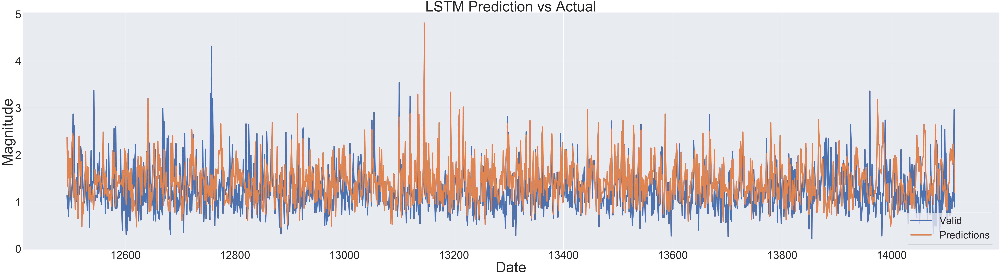

In [426]:
#Plot the data
train= data[:training_data_len]
valid= data[training_data_len: ]
valid['predictions']=predictions
plt.figure(figsize=(120,30))
plt.title('LSTM Prediction vs Actual', fontsize=100)
plt.xlabel('Date', fontsize=100)
plt.ylabel('Magnitude', fontsize=100)
# plt.plot(train['mag'])
plt.xticks(fontsize=75)
plt.yticks(fontsize=75)
plt.plot(valid[['mag', 'predictions']][-2500:], linewidth=8.5)
plt.legend(['Valid', 'Predictions'], loc= 'lower right', fontsize=70)
plt.show()
fig.savefig('LSTM1.png', bbox_inches='tight');

#### LSTM Model RMSE= .047, SMAPE= 13.80

## Baseline Model

In [69]:
import random

# list of random float between a range 50.50 to 500.50
randomFloatList = []
# Set a length of the list to 10
for i in range(0, 14116):
    # any random float between 50.50 to 500.50
    # don't use round() if you need number as it is
    x = round(random.uniform(0, 4), 2)
    randomFloatList.append(x)



In [70]:
# in my model I will just show 300 datapoints
work_results.reset_index(inplace=True)
v= list(work_results['time3'][-300:])

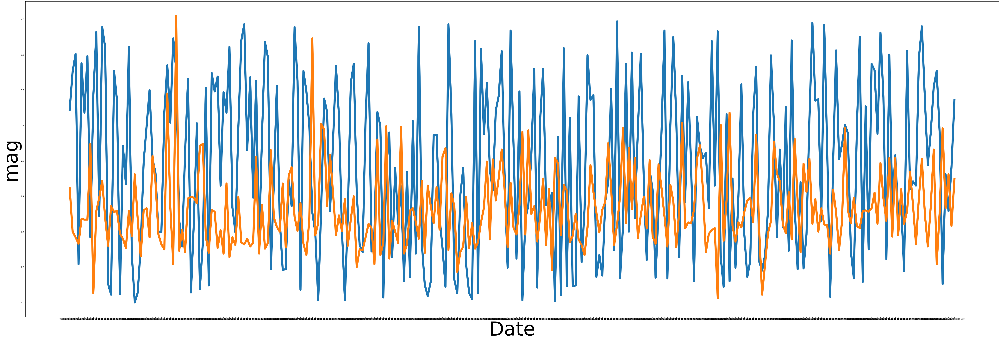

NameError: name 'fig' is not defined

In [76]:
# a plot of the data actual vs prediction
plt.figure(figsize=(90,30))
sns.lineplot(x=v,  y = randomFloatList[-300:] , linewidth=10.5)
plt.ylabel('Magnitude', fontsize=100)
plt.xlabel('Date', fontsize=100)
sns.lineplot(x=v, y=work_results['mag'][-300:], linewidth=10.5)
plt.show()
fig.savefig('dummy.png');

In [71]:
# RMSE
RMSE= np.sqrt( np.mean(randomFloatList[-300:]- y_test)**2)
RMSE

0.6727362908194701

In [74]:
#SMAPE
from pmdarima.metrics import smape
print(f"SMAPE: {smape(y_test[0], randomFloatList[300:])}")

SMAPE: 79.28983228204838


### Baseline Model RMSE=.673, SMAPE=79.269

## SARIMAX model

In [488]:
dataset=results['mag']
y=results['mag']

In [489]:
train_size=int(len(dataset) *0.8)
test_size = int(len(dataset)) - train_size

X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]

In [490]:
import statsmodels.api as sm

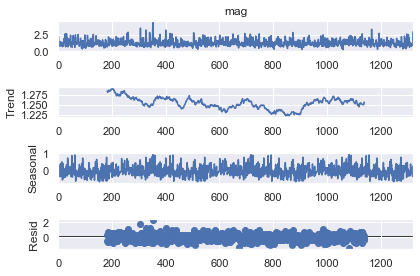

In [491]:
seas_d=sm.tsa.seasonal_decompose(work_results['mag'], period=365);
fig=seas_d.plot()
fig.set_figheight(4)
plt.show()


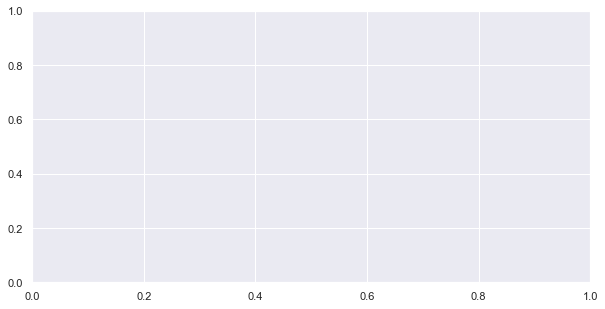

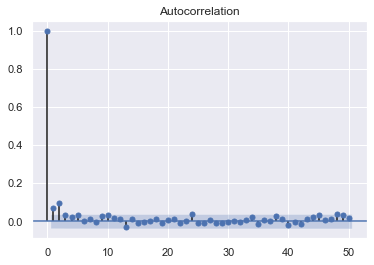

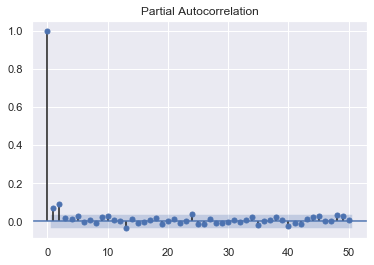

In [492]:
fig,ax=plt.subplots(figsize=(10,5))
fig=sm.tsa.graphics.plot_acf(y_test, lags=50)
fig=sm.tsa.graphics.plot_pacf(y_test, lags=50)
plt.show()

In [493]:
len(y_train)

11292

In [ ]:
from pmdarima.arima import auto_arima
model=auto_arima(y_train, exogenous= results[['depth']][:11292], start_p=0, start_q=0, 
 max_p=5, max_q=5, 
 d=0,
 trace=True,
 trend='c',
 suppress_warnings=True, 
 stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=17572.016, Time=2.80 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=17440.574, Time=4.45 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=17454.185, Time=7.00 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=17572.016, Time=3.16 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=17409.006, Time=7.32 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=17399.509, Time=10.10 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=17382.351, Time=13.07 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=17374.826, Time=15.22 sec
 ARIMA(5,0,1)(0,0,0)[0] intercept   : AIC=17370.322, Time=41.53 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=17371.765, Time=25.58 sec
 ARIMA(5,0,2)(0,0,0)[0] intercept   : AIC=17354.528, Time=34.47 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=17345.735, Time=28.31 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=17345.454, Time=22.88 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=17359.201, Time=22.75 sec


In [ ]:
len(y_train)

In [106]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1057
Model:               SARIMAX(1, 0, 0)   Log Likelihood                -728.574
Date:                Tue, 11 Aug 2020   AIC                           1465.148
Time:                        11:22:56   BIC                           1485.001
Sample:                             0   HQIC                          1472.674
                               - 1057                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.1400      0.047     24.319      0.000       1.048       1.232
depth          0.0028      0.004      0.702      0.482      -0.005       0.011
ar.L1          0.0739      0.029      2.525      0.012       0.017       0.131
sigma2         0.2324      0.008     28.784      0.000       0.217       0.248
===================================================================================
Ljung-Box (Q):                       41.63   Jarque-Bera (JB):               634.99
Prob(Q):                              0.40   Prob(JB):                         0.00
Heteroskedasticity (H):               0.81   Skew:                             1.26
Prob(H) (two-sided):                  0.05   Kurtosis:                         5.84
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [500]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
model= SARIMAX(y_train, 
 exog=results[['depth']][:11292],
 order=(4,0,3),
 enforce_invertibility=False, enforce_stationarity=False)

In [501]:
sarimax=model.fit()

/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


In [506]:
predictions= sarimax.predict(start =train_size, end=train_size+test_size,exog=results[['depth']][11291:])

In [507]:
predictions=pd.DataFrame(predictions)

In [508]:
predictions
predictions

,0
11292,1.600666
11293,1.564865
11294,1.559272
11295,1.583830
11296,1.658843
...,...
14112,1.645984
14113,1.689476
14114,1.550125
14115,1.705221


In [509]:
actuals=pd.DataFrame(y_test)

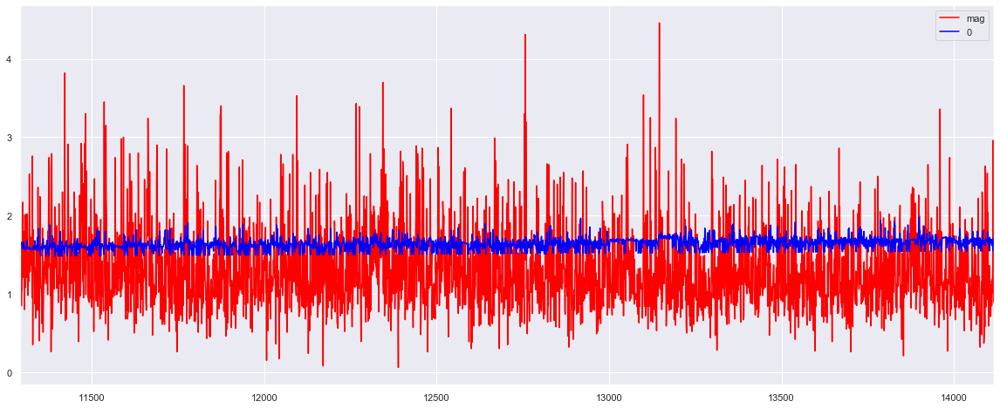

In [510]:
actuals.plot(legend=True, color='red', figsize=(20,8))
predictions[0].plot(figsize=(20,8), legend=True, color='blue')


#### SARIMAX model RMSE=.441, SMAPE=42.55

In [513]:
print(smape(predictions[0], results['mag'][11291:]))
RMSE= np.sqrt( np.mean(predictions[0]- results['mag'][11291:])**2)
RMSE

# print(mean_squared_error(predictions[0], predictions['Actual']))

38.42140641342927


0.33727063341961505

## SARIMA Model

In [115]:
dataset=work_results['mag']
y=work_results['mag']

In [116]:
train_size=int(len(dataset) *0.8)
test_size = int(len(dataset)) - train_size

X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]

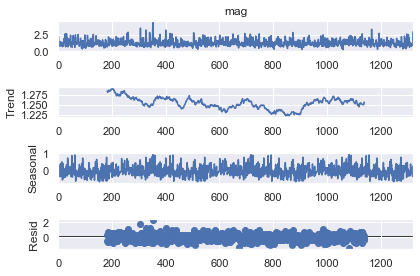

In [117]:
seas_d=sm.tsa.seasonal_decompose(work_results['mag'], period=365);
fig=seas_d.plot()
fig.set_figheight(4)
plt.show()

In [118]:
from pmdarima.arima import auto_arima
sarima=auto_arima(y_train, start_p=1, start_q=1, 
 max_p=6, max_q=6, 
 d=0,
 trace=True,
 trend='c',
method='cg',
 suppress_warnings=True, 
 stepwise=True)

Performing stepwise search to minimize aic


/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/pmdarima/arima/_auto_solvers.py:437: ModelFitWarning: Error fitting  ARIMA(1,0,1)(0,0,0)[0] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/pmdarima/arima/_auto_solvers.py", line 421, in _fit_candidate_model
    fit.fit(x, exogenous=xreg, **fit_params)
  File "/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/pmdarima/arima/arima.py", line 472, in fit
    self._fit(y, exogenous, **fit_args)
  File "/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/pmdarima/arima/arima.py", line 395, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/pmdarima/arima/arima.py", line 389, in _fit_wrapper
    **fit_args)
  File "/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/statespace/mlemodel.py", line 679, in fi

 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=80428.754, Time=44.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=4117.729, Time=0.30 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1465.008, Time=1.49 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=80428.754, Time=41.31 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=3.63 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1600.733, Time=0.76 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=1465.008, Time=1.41 sec

Best model:  ARIMA(0,0,1)(0,0,0)[0]          
Total fit time: 104.504 seconds


In [119]:
sarima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1057
Model:               SARIMAX(0, 0, 1)   Log Likelihood                -729.504
Date:                Tue, 11 Aug 2020   AIC                           1465.008
Time:                        11:24:45   BIC                           1479.897
Sample:                             0   HQIC                          1470.652
                               - 1057                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.2475      0.019     66.003      0.000       1.210       1.285
ma.L1          0.0382      0.030      1.292      0.197      -0.020       0.096
sigma2         0.2330      0.008     28.773      0.000       0.217       0.249
===================================================================================
Ljung-Box (Q):                       42.49   Jarque-Bera (JB):               659.80
Prob(Q):                              0.36   Prob(JB):                         0.00
Heteroskedasticity (H):               0.81   Skew:                             1.27
Prob(H) (two-sided):                  0.05   Kurtosis:                         5.92
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [120]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
sarima= SARIMAX(y_train, 
 exog=work_results[['depth']][:1057],
 order=(0,0,1),
 enforce_invertibility=False, enforce_stationarity=False)

In [121]:
sarima=model.fit()

In [122]:
predictions= sarima.predict(start =train_size, end=train_size+test_size,exog=work_results[['depth']][-266:])

In [123]:
predictions=pd.DataFrame(predictions)

In [124]:
predictions
predictions['Actual'] = work_results['mag'][-266:]

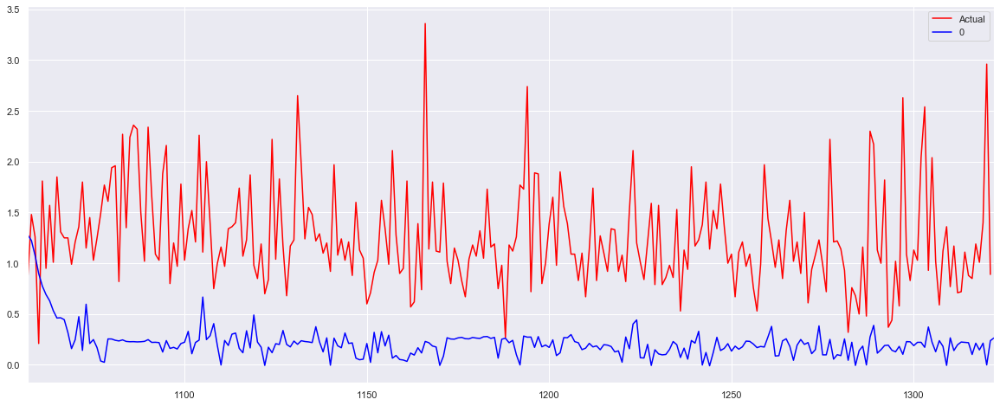

In [125]:
predictions['Actual'].plot(legend=True, color='red', figsize=(20,8))
predictions[0].plot(figsize=(20,8), legend=True, color='blue')

In [126]:
print(smape(predictions[0], work_results['mag'][-266:]))
RMSE= np.sqrt( np.mean(predictions[0]- results['mag'][-266:])**2)
RMSE

140.30852032400315


nan

### RMSE= 1.039, SMAPE= 140.31

## THE END